In [1]:
import os
from minepy import MINE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams['font.sans-serif'] = ['Times New Roman']

In [2]:
# Data pre-process
index = ["AN", "BOD", "COD", "DO", "pH", "TP", "WT", "CODCR"]
index_id_0 = [0, 1, 2, 3, 4, 5, 6]
index_id_1 = [0, 1, 2, 3, 4, 5, 7]
xticks = [i for i in range(1, 13)]

marker_list = [".", "o", "s", "p", "x", "*", "p", "D", "^"]

color_list_0 = ["#ffffd9","#d6efb3", "#73c8bd", "#2498c1", "#234c9f", "#000000"]
color_list_1 = ["#e2191b","#fa9998", "#73c8bd", "#2498c1", "#234c9f", "#000000"]

colors_0 = ['#1f77b4',
          '#ff7f0e',
          '#2ca02c',
          '#d62728',
          '#9467bd',
          '#e377c2',
          '#17becf',]
colors_1 = ['#1f77b4',
          '#ff7f0e',
          '#2ca02c',
          '#d62728',
          '#9467bd',
          '#e377c2',
          '#1a55FF']
data_list = []
for relation_name in ["MIC", "CS", "DC", "PC"]:

    file_path_1 = os.path.join("../relation_data", relation_name + "_indicators_yichang_7___2.csv")
    file_path_2 = os.path.join("../relation_data", relation_name + "_indicators_ziya_7___2.csv")
    r_data_0 = pd.read_csv(file_path_1)
    r_data_1 = pd.read_csv(file_path_2)
    r_data_0["region"] = "YRB"
    r_data_1["region"] = "HRB"
    r_data = pd.concat([r_data_0, r_data_1], axis=0, ignore_index=True)
    r_data["metric"] = relation_name
    r_data.columns = ["output", "time_step", "input", "cor_value", "region", "metric"]
    data_list.append(r_data)
data = pd.concat(data_list, axis=0, ignore_index=True)
data

,output,time_step,input,cor_value,region,metric
0,AN,1,AN,0.335027,YRB,MIC
1,AN,1,BOD,0.059222,YRB,MIC
2,AN,1,COD,0.074045,YRB,MIC
3,AN,1,DO,0.058972,YRB,MIC
4,AN,1,pH,0.086390,YRB,MIC
...,...,...,...,...,...,...
4699,CODCR,12,COD,0.773699,HRB,PC
4700,CODCR,12,DO,0.687471,HRB,PC
4701,CODCR,12,pH,0.252497,HRB,PC
4702,CODCR,12,TP,0.635824,HRB,PC


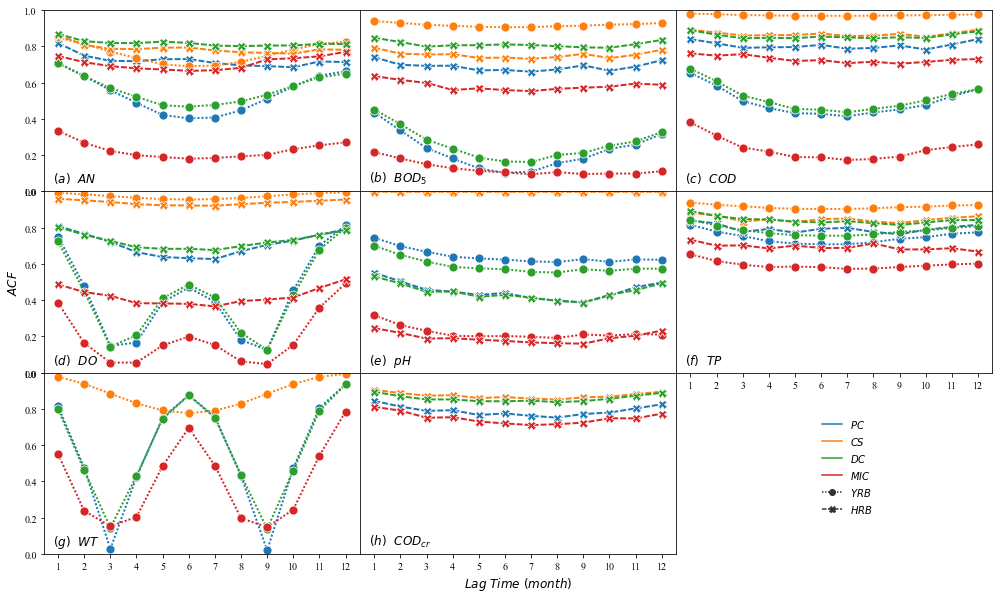

In [3]:
# autocorrelation coefficient
letters = ["a", "b", "c", "d", "e", "f", "g", "h"]
auto_data = data[data["output"]==data["input"]]
plt.rc('font', family='Times New Roman')
plt.rcParams["font.size"] = 10
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(17, 10))
palette = sns.color_palette("mako_r", 4)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0, hspace=0)
for i, item in enumerate(["AN", "BOD", "COD", "DO", "pH", "TP", "WT", "CODCR"]):
    letter = letters[i]
    item_data = auto_data[auto_data["output"]==item]
    hue_order = ["PC", "CS", "DC", "MIC"]
    
    r = i//3
    c = i%3

    style_order = ["YRB", "HRB"]
    dashes = [[1, 1], [3, 1]]
    sns.lineplot(
        data=item_data, x="time_step", y="cor_value",
        hue="metric", style="region",
#         palette="YlGnBu",
#         palette="Accent",
        palette=colors_0[:4],
#         palette=palette,
        ax=axes[r][c],
#         legend=False,
        markers=True,
        hue_order= hue_order,
        style_order=style_order,
        dashes=dashes,
        linewidth=2,
        markersize=9,
        )
    axes[r][c].set_xlabel("")
    axes[r][c].set_ylabel("")
    axes[r][c].set_xticks(xticks)
    axes[r][c].set_ylim(0, 1)
    if item == "BOD":
        item_text = "$(b)\ \ BOD_5$"
    elif item == "CODCR":
        item_text = "$(h)\ \ COD_{cr}$"
    else:
        item_text = "$("+ letter + ")\ \ "+ item + "$"

    axes[r][c].text(0.8, 0.05, item_text, fontsize=12)
    

axes[1][0].set_ylabel("$ACF$", fontsize=12)
axes[2][1].set_xlabel("$Lag\ Time\ (month)$", fontsize=12)

handles, labels = axes[1][0].get_legend_handles_labels()
handles_list = handles[1:5] + handles[6:]
labels_tuple = ("$PC$", "$CS$", "$DC$", "$MIC$", "$YRB$", "$HRB$")
axes[2][2].set_visible(False)
axes[0][0].legend(handles=handles_list, labels=labels_tuple, bbox_to_anchor=(2.65,-1.2), frameon=False)

# 去除其他几张子图的图例
for i in range(1,8):
    r = i//3
    c = i%3
    axes[r][c].get_legend().remove()
axes[0][0].set_xticks([]) 
axes[0][1].set_xticks([]) 
axes[0][2].set_xticks([]) 
axes[1][0].set_xticks([]) 
axes[1][1].set_xticks([]) 

axes[0][1].set_yticks([]) 
axes[0][2].set_yticks([]) 
axes[1][1].set_yticks([]) 
axes[1][2].set_yticks([]) 
axes[2][1].set_yticks([]) 


fig.savefig("ACF.jpg", dpi=1000, bbox_inches='tight')


In [4]:
# cross-correlation coefficient

index = ["AN", "BOD", "COD", "DO", "pH", "TP", "WT", "CODCR"]
index_id_0 = [0, 1, 2, 3, 4, 5, 6]
index_id_1 = [0, 1, 2, 3, 4, 5, 7]

xticks = [i for i in range(1, 13)]

marker_list = [".", "o", "s", "p", "x", "*", "p", "D", "^"]


color_list_0 = ["#ffffd9","#d6efb3", "#73c8bd", "#2498c1", "#234c9f", "#000000"]
color_list_1 = ["#e2191b","#fa9998", "#73c8bd", "#2498c1", "#234c9f", "#000000"]

colors_0 = ['#1f77b4',
          '#ff7f0e',
          '#2ca02c',
          '#d62728',
          '#9467bd',
          '#e377c2',
          '#17becf',]
colors_1 = ['#1f77b4',
          '#ff7f0e',
          '#2ca02c',
          '#d62728',
          '#9467bd',
          '#e377c2',
          '#1a55FF']

line_object_list = []
with plt.style.context(['science','no-latex', 'ieee']):
    for relation_name in ["MIC", "CS", "DC", "PC"]:
        
        file_path_1 = os.path.join("../relation_data", relation_name + "_indicators_yichang_7___2.csv")
        file_path_2 = os.path.join("../relation_data", relation_name + "_indicators_ziya_7___2.csv")
        r_data_0 = pd.read_csv(file_path_1)
        r_data_1 = pd.read_csv(file_path_2)

        plt.rc('font', family='Times New Roman')
        plt.rcParams["font.size"] = 10
        fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(12, 22))

        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.22)

        for a in range(2):
            r_data = eval("r_data_" + str(a))
            index_id = eval("index_id_" + str(a))
           
            for c, id in enumerate(index_id):
                n = index[id]
                item_data = r_data[r_data["output"] == n]

                axes[c][0].set_ylabel("$CCF$")
    
                axes[c][a].set_xticks(xticks)
                axes[c][a].set_ylim(0, 1)
                if a == 0:
                    hue_order = ["AN", "BOD", "COD", "DO", "pH", "TP", "WT"]
                    colors = colors_0
                else:
                    hue_order = ["AN", "BOD", "COD", "DO", "pH", "TP", "CODCR"]
                    colors = colors_1
                sns.lineplot(
                    data=item_data, x="time_step", y="cor_value",
                    hue="indicator", style="indicator",
                    palette=colors,
                    ax=axes[c][a],
                    legend=False,
                    markers=True,
                    hue_order= hue_order,
                    dashes=[[1, 1], [1, 1],[1, 1],[1, 1],[1, 1],[1, 1],[1, 1]],
                    linewidth=2,
                    markersize=9,
                )            
                axes[c][1].set_ylabel("")
                axes[c][0].set_xlabel("")
                axes[c][1].set_xlabel("")
                if n == "BOD":
                    item_text = "$BOD_5$"
                elif n == "CODCR":
                    item_text = "$COD_{cr}$"
                    
                else:
                    item_text = "$" + n + "$"

                axes[c][a].text(0.8, 1.05, item_text, fontsize=12)
                

        labels_0 = ("$AN$", "$BOD_5$", "$COD$", "$DO$", "$pH$", "$TP$", "$WT$")
        labels_1 = ("$AN$", "$BOD_5$", "$COD$", "$DO$", "$pH$", "$TP$", "$COD_{cr}$")
        if relation_name == "MIC":
            axes[4][0].legend(labels_0, labelspacing=0.1, fontsize=12)
            axes[4][1].legend(labels_1, labelspacing=0.1, fontsize=12)
        if relation_name == "CS":
            axes[4][0].legend(labels_0, labelspacing=0.1, fontsize=12)
            axes[4][1].legend(labels_1, labelspacing=0.1, fontsize=12)
        if relation_name == "DC":
            axes[1][0].legend(labels_0, labelspacing=0.1, fontsize=12)
            axes[4][1].legend(labels_1, labelspacing=0.1, fontsize=12)
        if relation_name == "PC":
            axes[1][0].legend(labels_0, labelspacing=0.1, fontsize=12)
            axes[4][1].legend(labels_1, labelspacing=0.1, fontsize=12)
            
        for i in range(2):
            for j in range(7):
                axes[j][i].get_lines()[j].remove()
        
        axes[6][0].text(0.4, -0.24, "$(a)$",)
        axes[6][1].text(0.4, -0.24, "$(b)$",)
        axes[6][0].set_xlabel("$Lag\ Time\ (month)$", fontsize=12)
        axes[6][1].set_xlabel("$Lag\ Time\ (month)$", fontsize=12)
        save_name = relation_name + "_CCF.jpg"
        save_path = os.path.join("./figures", save_name)
        fig.savefig(save_name, dpi=1000, bbox_inches='tight')